# Importing Libraries

In [1]:
pip install mlflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.4/28.4 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 648.7/648.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 4.7 MB/s eta 0:00:00


In [1]:
import mlflow
import mlflow.sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import pandas as pd

## Load the data

In [2]:
data = pd.read_csv('/content/processed_fraud_data.csv')

In [3]:
data

,time_since_signup,purchase_value,lower_bound_ip_address,upper_bound_ip_address,age,purchase_hour,hour_of_day,day_of_week,country_grouped_United States,browser_Chrome,...,source_Ads,browser_IE,sex_F,sex_M,source_Direct,browser_Safari,country_grouped_None,browser_FireFox,country_grouped_China,class
0,-0.437279,0.931338,-1.048724,-1.040248,-0.944649,10,10,5,1.0,0.0,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
1,1.633857,0.221836,0.553235,0.552383,0.563874,21,21,5,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0
2,0.555032,0.549298,-1.484225,-1.476923,-0.944649,11,11,3,1.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
3,-1.458852,1.367955,-1.146185,-1.151178,-1.408809,23,23,2,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
4,-0.096136,-0.105627,0.720279,0.719657,-1.640890,20,20,2,1.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150473,1.671560,2.459497,-0.481958,-0.485601,3.000717,7,7,2,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0
150474,0.167641,-0.924284,0.527937,0.526631,0.447833,7,7,3,1.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
150475,0.847857,-0.214781,1.320163,1.320965,0.215753,23,23,4,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0
150476,1.172154,1.586263,1.113553,1.113798,1.724275,20,20,2,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0


In [4]:
data.shape

(150478, 21)

In [5]:
# Determine the subsample size with 25%
subsample_size = 0.25

# Calculate the number of samples to keep
num_samples_to_keep = int(subsample_size * len(data))

# Randomly sample the data
data = data.sample(n=num_samples_to_keep, random_state=42)

In [6]:
data.shape

(37619, 21)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37619 entries, 89541 to 134945
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   time_since_signup              37619 non-null  float64
 1   purchase_value                 37619 non-null  float64
 2   lower_bound_ip_address         37619 non-null  float64
 3   upper_bound_ip_address         37619 non-null  float64
 4   age                            37619 non-null  float64
 5   purchase_hour                  37619 non-null  int64  
 6   hour_of_day                    37619 non-null  int64  
 7   day_of_week                    37619 non-null  int64  
 8   country_grouped_United States  37619 non-null  float64
 9   browser_Chrome                 37619 non-null  float64
 10  source_SEO                     37619 non-null  float64
 11  source_Ads                     37619 non-null  float64
 12  browser_IE                     37619 non-null 

In [8]:
# set target feature
X_fraud = data.drop(columns=['class'])
y_fraud = data['class']

In [9]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_fraud, y_fraud, test_size=0.2, random_state=42)

In [10]:
# drop na
X_train.dropna(inplace=True)
y_train.dropna(inplace=True)
X_test.dropna(inplace=True)
y_test.dropna(inplace=True)

In [11]:
# Apply SMOTE to handle class imbalance
# Change k_neighbors to a value less than or equal to the number of samples in your minority class
smote = SMOTE(random_state=42, k_neighbors=3)  # Try 5, 3, or even 1 if necessary
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Start MLflow experiment
mlflow.set_experiment("E-Commerce Fraud Detection")

<Experiment: artifact_location='file:///content/mlruns/497492827055381216', creation_time=1739879849056, experiment_id='497492827055381216', last_update_time=1739879849056, lifecycle_stage='active', name='E-Commerce Fraud Detection', tags={}>

# MLflow

In [15]:
# Start MLflow experiment
mlflow.set_experiment("E-Commerce Fraud Detection")

with mlflow.start_run():
    # Log parameters
    mlflow.log_param("dataset", "Fraud_Data")
    mlflow.log_param("model_type", "Random Forest")
    mlflow.log_param("class_imbalance_handling", "SMOTE")

    # Train the model
    rf_model_fraud = RandomForestClassifier(random_state=42)
    rf_model_fraud.fit(X_train_res, y_train_res)

    # Evaluate the model
    y_pred_fraud = rf_model_fraud.predict(X_test) # Use X_test for prediction
    report_fraud = classification_report(y_test, y_pred_fraud, output_dict=True) # Use y_test for evaluation
    roc_auc_fraud = roc_auc_score(y_test, y_pred_fraud) # Use y_test for evaluation


# Log metrics
mlflow.log_metric("precision", report_fraud["1"]["precision"]) # Accessing with key '1'
mlflow.log_metric("recall", report_fraud["1"]["recall"]) # Accessing with key '1'
mlflow.log_metric("f1_score", report_fraud["1"]["f1-score"]) # Accessing with key '1'
mlflow.log_metric("roc_auc", roc_auc_fraud)

# Log the model
mlflow.sklearn.log_model(rf_model_fraud, "random_forest_fraud_data_model")
print("Fraud Data Model Logged to MLflow!")

2025/02/18 13:55:00 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Fraud Data Model Logged to MLflow!


In [16]:
import os
import joblib

# Create the 'models' directory if it doesn't exist
os.makedirs('models', exist_ok=True)

# Now you can safely dump the model
joblib.dump(rf_model_fraud, 'models/random_forest_fraud_data_model.pkl')

['models/random_forest_fraud_data_model.pkl']

# Versioning Models

In [17]:
import mlflow.sklearn
# Load the logged model for fraud data
model_fraud = mlflow.sklearn.load_model("runs:/<RUN_ID>/random_forest_fraud_data_model")

MlflowException: Invalid value "<RUN_ID>" for parameter 'run_id' supplied.

# Model Explainability

In [18]:
pip install shap lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0d9066d0f84af6da2b24fede99a377d4d4fc7050ef22b2fa580fe679cd7de917
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


## Explaining the Random Forest Model with SHAP

In [19]:
import shap

# Load the trained Random Forest model (replace with your model)
rf_model_fraud = joblib.load("models/random_forest_fraud_data_model.pkl")

# Initialize SHAP explainer for fraud data
explainer_fraud = shap.TreeExplainer(rf_model_fraud)
shap_values_fraud = explainer_fraud.shap_values(X_test)

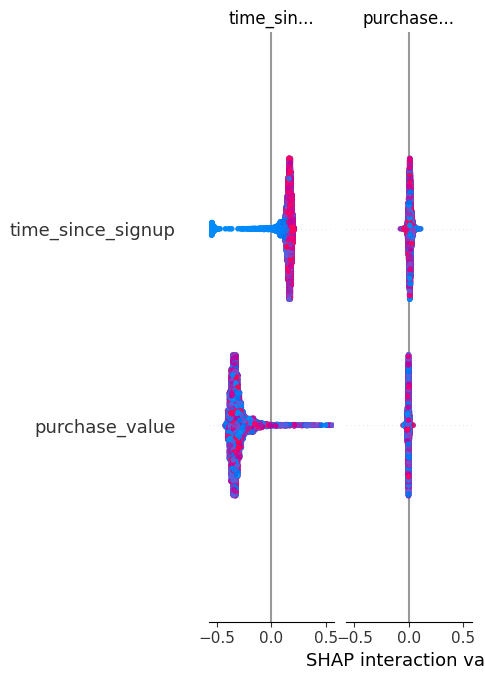

In [20]:
# Summary plot for fraud data
shap.summary_plot(shap_values_fraud, X_test, plot_type="bar")

In [21]:
# Force plot for fraud data
shap.initjs()
shap.plots.force(explainer_fraud.expected_value[0], shap_values_fraud[..., 0])

/usr/local/lib/python3.11/dist-packages/shap/plots/_force.py:208: UserWarning: shap.plots.force is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.plots.force is slow for many thousands of rows, try subsampling your data.")


## Using LIME for Explainability

In [26]:
import lime
import lime.lime_tabular

# Initialize LIME explainer for fraud data
explainer_fraud_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns,
    class_names=['Non-Fraud', 'Fraud'],
    mode='classification'
)

In [27]:
# Explain a single prediction for fraud data (first instance in the test set)
exp_fraud = explainer_fraud_lime.explain_instance(X_test.iloc[0, :], rf_model_fraud.predict_proba, num_features=10)
exp_fraud.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [ ]:
# PartialDependenceDisplay
